### Exploratory Data Analysis - Canadian Heritage Funding

Contributors: Artan Zandian, Joyce Wang, Amelia Tang, Wenxin Xiang
- Link to the project repository: https://github.com/UBC-MDS/canadian_heritage_funding
- Link to the EDA report: https://github.com/UBC-MDS/canadian_heritage_funding/blob/main/eda/eda_heritage_data.ipynb

#### Introduction

We are conducting exploratory data analysis on the data collected from the Canadian Government Open Data. We try to answers two questions. The primary one being given information non-indicative of artistic merit, such as location, audience, and discipline, what the funding size would be for art projects related to Canadian heritage. We also would like to draw conclusion on whether we can make reasonable predictions. 
- Information on the data set can be found here: https://open.canada.ca/data/en/dataset/92984c11-6fd4-40c4-b23c-e8832e1f4cd5

In [1]:
import altair as alt
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
alt.renderers.enable('mimetype')
# from altair_saver import save
# alt.data_transformers.enable("data_server")
# alt.renderers.enable('altair_saver', fmts=['png'])

RendererRegistry.enable('mimetype')

#### Load data and data cleaning

In [2]:
url = "https://open.canada.ca/data/dataset/92984c11-6fd4-40c4-b23c-e8832e1f4cd5/resource/148841f0-11c9-4f45-8700-d0a4717dea2f/download/capf_en.csv"
heritage = pd.read_csv(url, encoding="ISO-8859-1")
len(heritage)

1358

In [3]:
# data cleaning
heritage.columns = heritage.columns.str.lower().str.replace(" ", "_")
heritage = heritage.rename(columns={"grant_or_contributionution": "grant_or_contribution"})
heritage["audiences"] = heritage["audiences"].str.split(", ", expand=False)
heritage["disciplines"] = heritage["disciplines"].str.split(", ", expand=False)

#### Split the data

Before the EDA analysis, we split the data by 80%/20%. 

In [4]:
heritage_train, heritage_test = train_test_split(heritage, test_size=0.20, random_state=1233)

## EDA
- We observed that there are 14 columns and one column, our target,`amount_approved`, is numeric. However, after further examining the values in the column, we noticed that the values were not continuous as it had a definite amount of unique values. Therefore, our question is a classification problem instead of a regression problem. This column needs to be grouped into classes based on values.   
- We noticed that `audiences` and `disciplines` columns contain lists of values and need to be processed before model building. 

In [5]:
heritage_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1086 entries, 798 to 101
Data columns (total 14 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   fiscal_year            1086 non-null   object
 1   organization_name      1086 non-null   object
 2   project_name           1086 non-null   object
 3   city                   1086 non-null   object
 4   province               1086 non-null   object
 5   region                 1086 non-null   object
 6   community_type         1086 non-null   object
 7   grant_or_contribution  1086 non-null   object
 8   amount_approved        1086 non-null   int64 
 9   presenter_type         1086 non-null   object
 10  disciplines            1086 non-null   object
 11  audiences              1086 non-null   object
 12  project_sub_type       1086 non-null   object
 13  project_type           1086 non-null   object
dtypes: int64(1), object(13)
memory usage: 127.3+ KB


In [6]:
heritage_train.describe()

,amount_approved
count,1086.000000
mean,43713.622468
std,75981.314470
min,3000.000000
25%,12000.000000
50%,23000.000000
75%,50000.000000
max,1000000.000000


In [7]:
heritage_train['amount_approved'].unique()

array([  10500,    3000,   45000,   70000,   30000,   10000,   17500,
         15000,   55000,   33000,  360000,   20000,   25000,   13000,
         35000,    5000,   95000,   50000,   40000,   43500,  175000,
          7500,   18000,   43000,   28000,    9000,  170000,   14000,
          7000,   80000,   25200,   68000,    8000,   47000,   66300,
         17000,   23000,  100000,   75000,   60000,  800000,   24000,
         12000,  105000,    3600,   26000,   22000,   41000,   63000,
          6000,  145000,  550000,    8500,   90000,    4500,  130000,
         11000,   22500,   85000,  165000,   13300,   73000,   72500,
          4000,   65000,  110000,   49500,    9500,   20600,   38350,
         16000,   37000,   91605,   42000,   14500,   72000,   57500,
        135500,   26500,   12500,    4850,   16500,   52000,    6500,
          5500,  300000,    7100,  230000,   53000,   37500,   57000,
        327000,   21000,   99500,   62000,   13500,  250000,  500000,
         31000,  330

#### Create new column for classification

- To address that our target feature was not continuous, we grouped the values into four categories based on its 10%, 25%, 50% and 75% quantile and created four classes/categories for building the classification models.  

In [8]:
q10 = heritage_train["amount_approved"].quantile(0.1)
q25 = heritage_train["amount_approved"].quantile(0.25)
q50 = heritage_train["amount_approved"].quantile(0.5)
q75 = heritage_train["amount_approved"].quantile(0.75)

labeling = [f"${q75/1000}K",
            f"${q50/1000}K",
            f"${q25/1000}K",
            f"${q10/1000}K",
            f"less than ${q10/1000}K"]

amount = heritage_train["amount_approved"]
heritage_train["greater_than"] = np.where(amount > q75, labeling[0],
                                          np.where(amount > q50, labeling[1],
                                                   np.where(amount > q25, labeling[2],
                                                            np.where(amount > q10, labeling[3], labeling[4]))))

### Amount approved distribution

- Now, we would like to look at the distribution of our target features. We noticed class imbalances here. For instance, we have fewer amounts less than $8k CAD compared with other ranges. Although not extremely significant, we need to keep that in mind while building models. 

In [9]:
heritage_train.groupby("greater_than").count()["amount_approved"]

greater_than
$12.0K             266
$23.0K             288
$50.0K             250
$8.0K              161
less than $8.0K    121
Name: amount_approved, dtype: int64

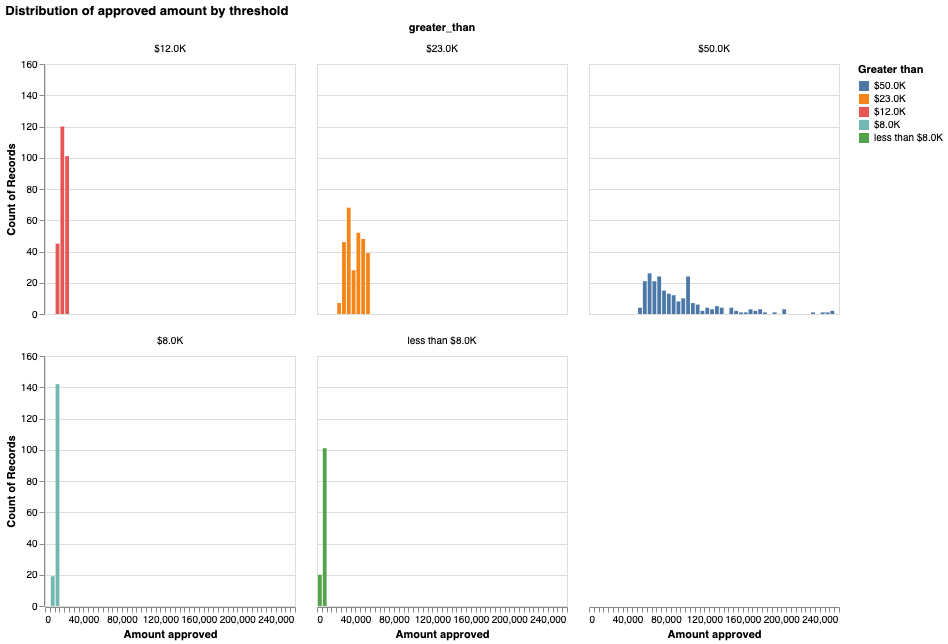

In [10]:
eda_heritage = (
    alt.Chart(heritage_train).mark_bar(clip=True).encode(
        alt.X("amount_approved", scale=alt.Scale(domain=(0, 260000)), 
              bin=alt.Bin(maxbins=200), stack=False, title="Amount approved"),
        alt.Y("count()"),
        alt.Color("greater_than", sort=labeling, title = "Greater than"))
    .properties(width=250, height=250)
    .facet("greater_than", columns=3, title="Distribution of approved amount by threshold")
)
eda_heritage

### Distributions of feature values

- Then, we would like to look at what values the other features have and their distributions. 
- It should be noted that for the features `disciplines` and `audiences`, an example can belong to multiple categories, so the counts in the plots contain repeats in the data.
- We did not recognize anything concerning or worth attention after examining their distributions. 

In [11]:
columns_eda = ['fiscal_year',
               'province',
               'region',
               'community_type',
               'grant_or_contribution',
               'presenter_type',
               'project_sub_type',
               'project_type']
columns_exploded = ["disciplines", "audiences"]

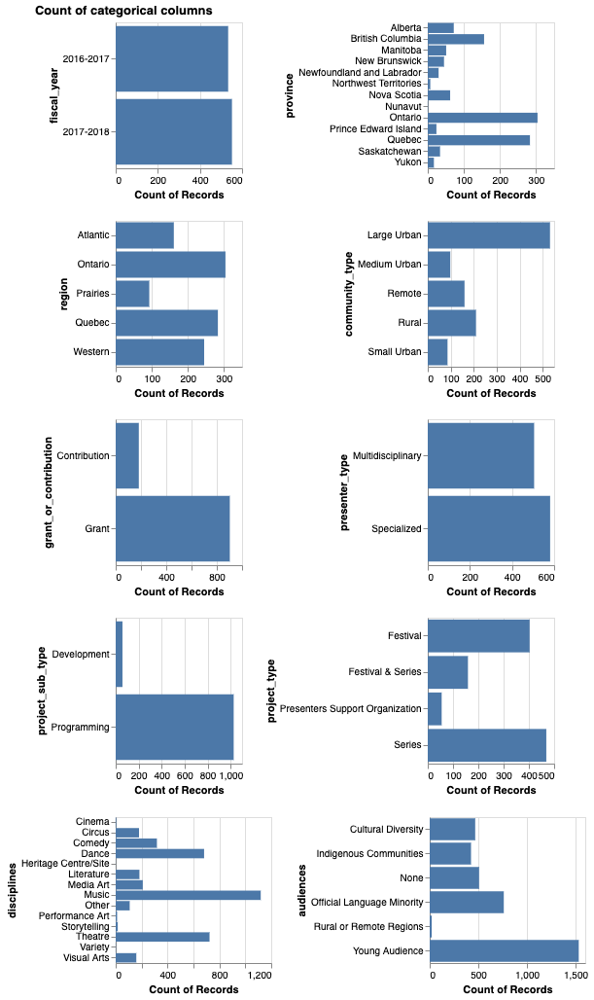

In [12]:
eda = (
    alt.Chart(heritage_train).mark_bar().encode(
        alt.Y(alt.repeat(), type="ordinal"),
        alt.X("count()", stack=False),)
    .properties(width=130, height=150)
    .repeat(columns_eda, columns=2, title="Count of categorical columns")
)

heritage_train_explode = heritage_train.explode("audiences").explode("disciplines")
eda_expl = (
    alt.Chart(heritage_train_explode).mark_bar().encode(
        alt.Y(alt.repeat(), type="ordinal"),
        alt.X("count()", stack=False),)
    .properties(width=160, height=150)
    .repeat(columns_exploded)
)

eda & eda_expl

- We also would like to see whether different cities in different regions/provinces receive different numbers/counts of funding. 
- It is indicated that there are indeed cities receive way more numbers/counts of funding than others. It is not an equal distribution in numbers among different cities while the Canadian Heritage Fund distributes the funds. 
- Again it should be noted that plots for `disciplines` and `audiences` contain repeated data.

In [13]:
eda_city_region = (
    alt.Chart(heritage_train, title="Numbers of funding received per city by region").mark_bar().encode(
        alt.Y("city", sort="color", title=""),
        alt.X("count()"),
        alt.Color("region", title="Region"))
    .properties(width=300, height=2000)
)

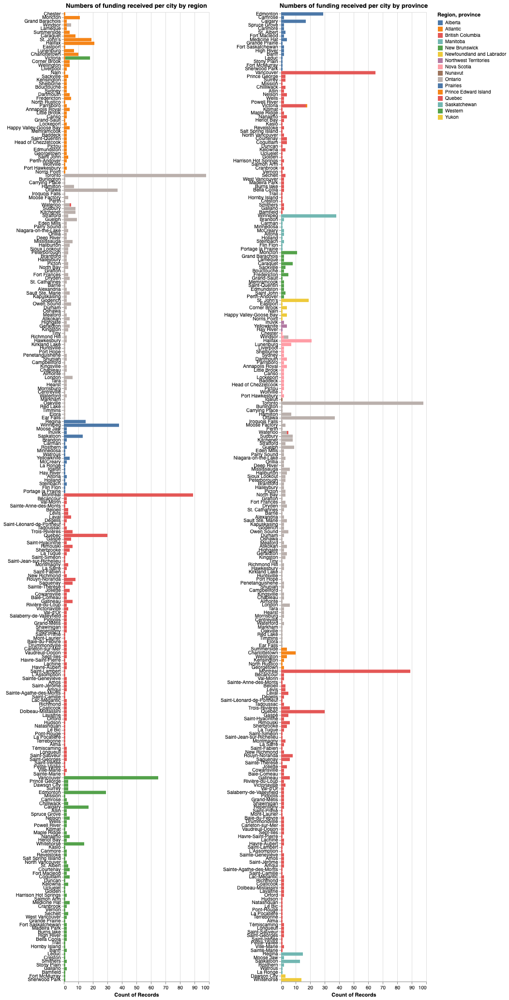

In [14]:
eda_city_province = (
    alt.Chart(heritage_train, title="Numbers of funding received per city by province").mark_bar().encode(
        alt.Y("city", sort="color", title=""),
        alt.X("count()"),
        alt.Color("province", title="province"))
    .properties(width=300, height=2000)
)
alt.hconcat(eda_city_region, eda_city_province)

### Features vs Amount Approved

- We would like to know whether different features are potentially associated with different funding amounts. Therefore, we created the graph below.
- We do observe variations in funding amounts for different features. 

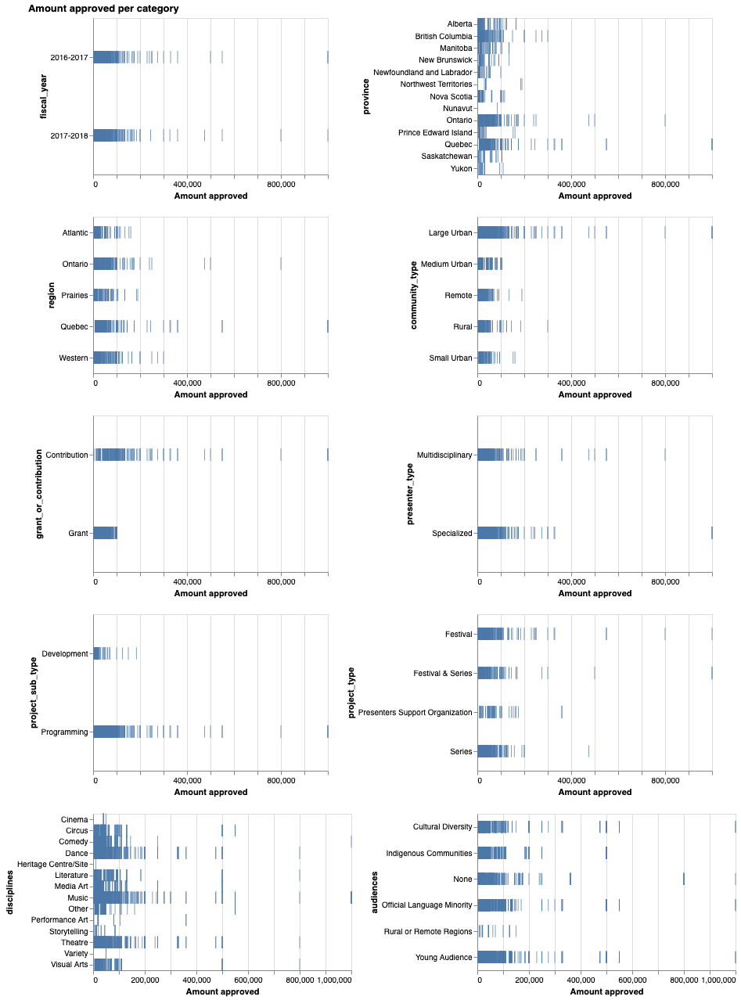

In [15]:
eda_vs_amt = (
    alt.Chart(heritage_train).mark_tick(width=15).encode(
        alt.Y(alt.repeat(), type="ordinal"),
        alt.X("amount_approved", title="Amount approved"),)
    .properties(width=300, height=200)
    .repeat(columns_eda, columns=2, title="Amount approved per category")
)

eda_vs_amt_expl = (
    alt.Chart(heritage_train_explode).mark_tick(width=15).encode(
        alt.Y(alt.repeat(), type="ordinal"),
        alt.X("amount_approved", title="Amount approved"),)
    .properties(width=330, height=200)
    .repeat(columns_exploded, columns=2)
)

eda_vs_amt & eda_vs_amt_expl

- We examined whether different cities, regions and provinces received different counts of funding before. Now, we would also like to look at whether different cities, regions and provinces receive different amounts of funding. 
- From the graphs, we can see that the amount of funding received by different cities, regions and provinces vary from each other. 

In [16]:
eda_city_region_amt = (
    alt.Chart(heritage_train, title="Received funding amount per city by region").mark_point(size=7, opacity=0.8).encode(
        alt.Y("city", sort="color", title=None),
        alt.X("amount_approved", title="Amount approved"),
        alt.Color("region", title="Region"))
    .properties(width=300, height=2000)
)

In [17]:
eda_city_province_amt = (
    alt.Chart(heritage_train, title="Received funding amount per city by province").mark_point(size=7, opacity=0.8).encode(
        alt.Y("city", sort="color", title=None),
        alt.X("amount_approved", title="Amount approved"),
        alt.Color("province", title="province"))
    .properties(width=300, height=2000)
)

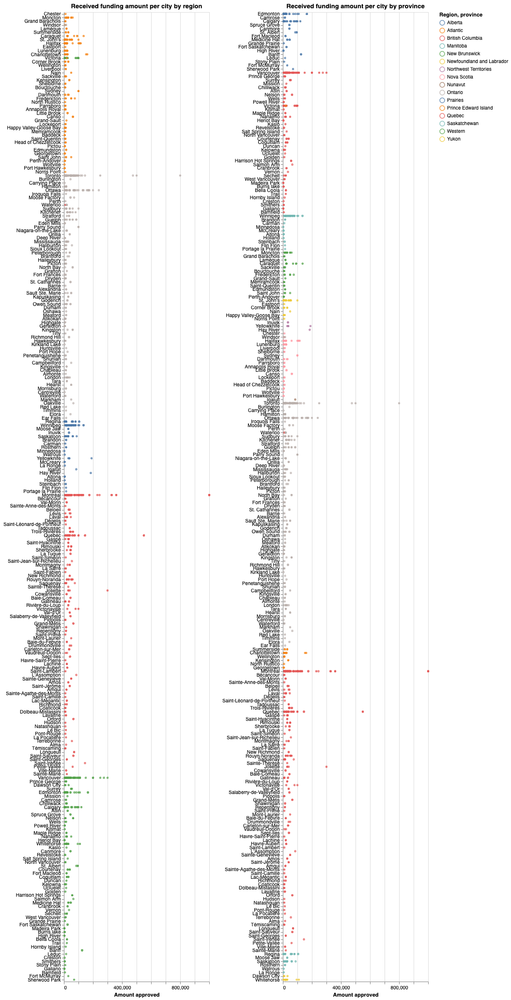

In [18]:
alt.hconcat(eda_city_region_amt, eda_city_province_amt)

### Feature counts with target categories

- Lastly, we would like to examine how the target categories counts distribute among all features. If we see the same or similar distribution among all values in a feature, then this feature might not be a good feature to include in the model because it will not give us much information.  
- We observe that the distributions for different fiscal years are similar. Therefore, we consider dropping this feature `fiscal_year`. 

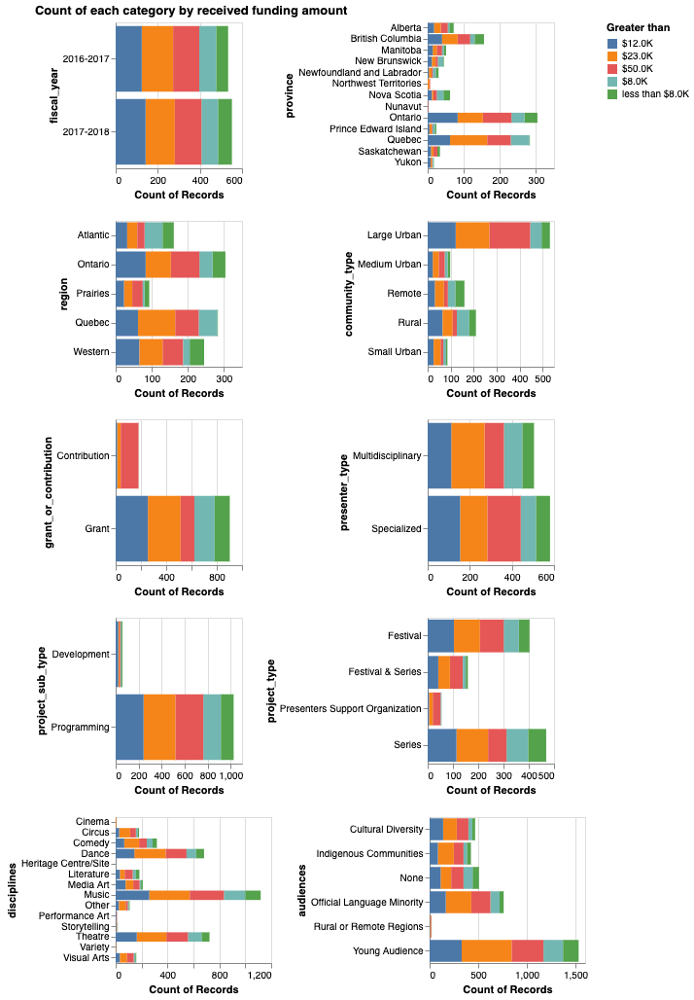

In [19]:
eda_cat = (
    alt.Chart(heritage_train).mark_bar().encode(
        alt.Y(alt.repeat(), type="ordinal"),
        alt.X("count()"),
        alt.Color("greater_than", title="Greater than"))
    .properties(width=130, height=150)
    .repeat(columns_eda, columns=2, title="Count of each category by received funding amount")
)
eda_cat2 = (
    alt.Chart(heritage_train_explode).mark_bar().encode(
        alt.Y(alt.repeat(), type="ordinal"),
        alt.X("count()"),
        alt.Color("greater_than", title="Greater than"))
    .properties(width=160, height=150)
    .repeat(columns_exploded)
)

eda_cat & eda_cat2

Again it should be noted that plots for `disciplines` and `audiences` contain repeated data.

### Fixed pooled funding per discipline

Again, an interesting observation was that the chances that a project get funded is well relied on it's discipline as the Federal government has a fixed budget pool per discipline per year. This makes the two years comparable. It is reasonable to drop `fiscal_year` feature. 

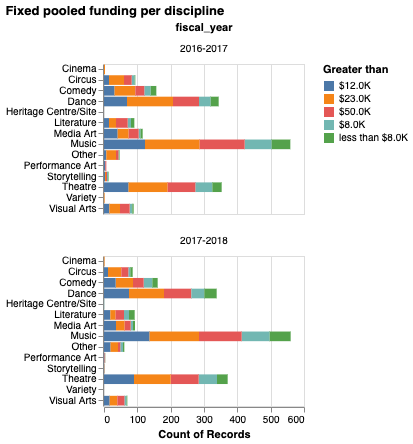

In [20]:
eda4 = (
    alt.Chart(heritage_train_explode).mark_bar().encode(
        alt.Y("disciplines", type="ordinal", title=None),
        alt.X("count()"),
        alt.Color("greater_than", title="Greater than"))
    .properties(width=200, height=150)
    .facet("fiscal_year", columns=1, title="Fixed pooled funding per discipline")
)
eda4